In [1]:
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
import urllib


In [2]:

# ✅ 가중치 다운로드 (top 제거 버전)
weights_url = "https://storage.googleapis.com/tensorflow/keras-applications/inception_resnet_v2/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5"
weights_file = "inception_resnet_v2_notop.h5"
urllib.request.urlretrieve(weights_url, weights_file)

('inception_resnet_v2_notop.h5', <http.client.HTTPMessage at 0x1f4b6d256a0>)

In [3]:
# ✅ 사전학습 모델 로드
pre_trained_model = InceptionResNetV2(
    weights=None,
    include_top=False,
    input_shape=(224, 224, 3)
)
pre_trained_model.load_weights(weights_file)

In [4]:
pre_trained_model.load_weights(weights_file)# ✅ 동결
for layer in pre_trained_model.layers:
    layer.trainable = False

In [5]:
# ✅ 커스텀 출력층
last_output = pre_trained_model.get_layer('conv_7b_ac').output
x = layers.GlobalAveragePooling2D()(last_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(25, activation='softmax')(x)

model = Model(pre_trained_model.input, x)
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [6]:

# ✅ 데이터 디렉토리 (100장으로 전처리된 폴더 기준)
train_dir = './resized_dataset/train_split/'
val_dir = './resized_dataset/validation_split/'

In [7]:
# ✅ 증강 제거: 단순 정규화만
datagen = ImageDataGenerator(rescale=1/255.0)

In [8]:
# ✅ 제너레이터 생성
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

Found 2000 images belonging to 25 classes.


In [9]:
val_generator = datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 500 images belonging to 25 classes.


In [10]:
# ✅ 조기 종료
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True
)

In [11]:
# ✅ 학습 시작
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=500,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/500


C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


63/63 ━━━━━━━━━━━━━━━━━━━━ 52s 716ms/step - accuracy: 0.1550 - loss: 3.3591 - val_accuracy: 0.8000 - val_loss: 0.9382
Epoch 2/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 45s 723ms/step - accuracy: 0.5809 - loss: 1.3747 - val_accuracy: 0.8540 - val_loss: 0.5246
Epoch 3/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 45s 722ms/step - accuracy: 0.7080 - loss: 0.9398 - val_accuracy: 0.8820 - val_loss: 0.4009
Epoch 4/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 45s 722ms/step - accuracy: 0.7781 - loss: 0.6766 - val_accuracy: 0.8880 - val_loss: 0.3406
Epoch 5/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 45s 718ms/step - accuracy: 0.7983 - loss: 0.5855 - val_accuracy: 0.8880 - val_loss: 0.3220
Epoch 6/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 46s 728ms/step - accuracy: 0.8185 - loss: 0.5095 - val_accuracy: 0.8960 - val_loss: 0.2772
Epoch 7/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 46s 727ms/step - accuracy: 0.8488 - loss: 0.4574 - val_accuracy: 0.9140 - val_loss: 0.2563
Epoch 8/500
63/63 ━━━━━━━━━━━━━━━━━━━━ 46s 733ms/step - accuracy: 0.8642 - loss: 0.4102 - val_accuracy

16/16 ━━━━━━━━━━━━━━━━━━━━ 14s 729ms/step


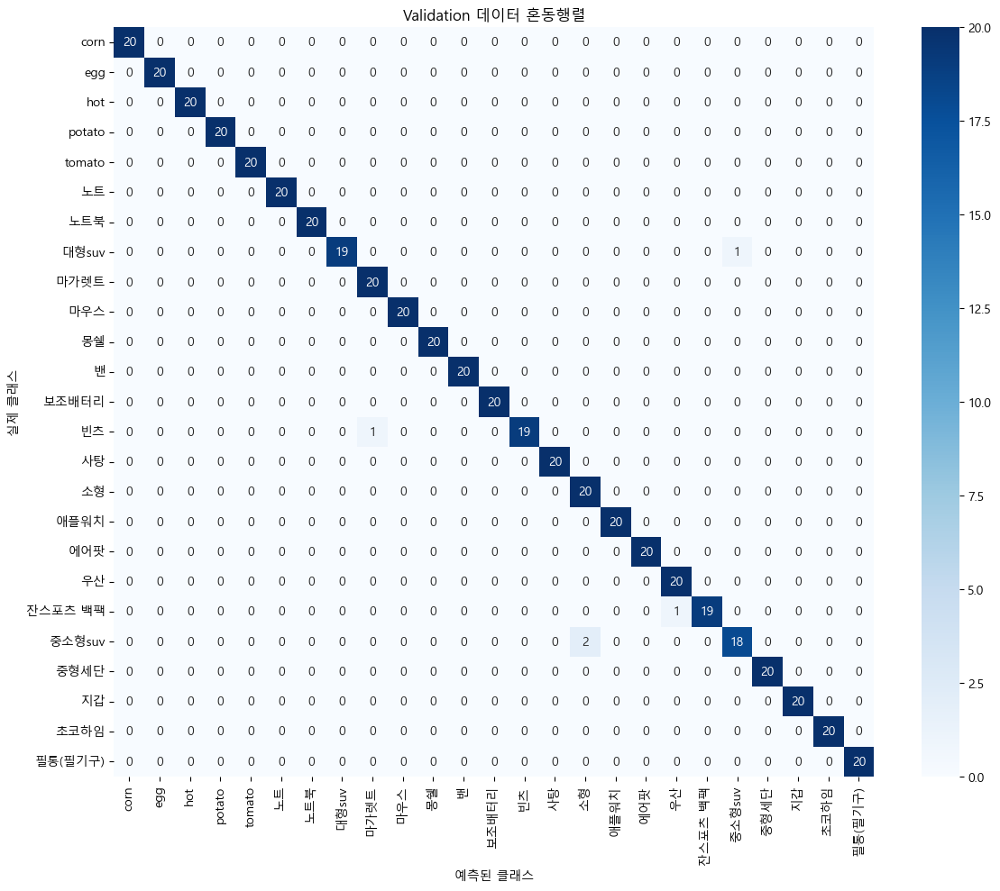

In [12]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ✅ 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# ✅ 클래스 이름
class_names = list(val_generator.class_indices.keys())

# ✅ 예측 수행
val_generator.reset()
val_preds = model.predict(val_generator)
y_pred_val = np.argmax(val_preds, axis=1)
y_true_val = val_generator.classes

# ✅ 혼동행렬
cm_val = confusion_matrix(y_true_val, y_pred_val)

# ✅ 시각화
plt.figure(figsize=(12, 10))
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('예측된 클래스')
plt.ylabel('실제 클래스')
plt.title('Validation 데이터 혼동행렬')
plt.tight_layout()
plt.show()


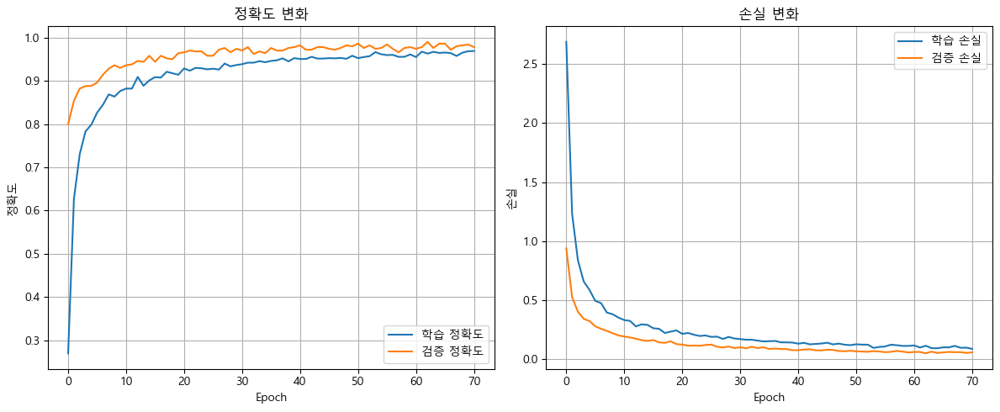

In [13]:
import matplotlib.pyplot as plt

# ✅ 한글 폰트 설정 (Windows 환경용)
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# ✅ 정확도 그래프
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='학습 정확도')
plt.plot(history.history['val_accuracy'], label='검증 정확도')
plt.title('정확도 변화')
plt.xlabel('Epoch')
plt.ylabel('정확도')
plt.legend()
plt.grid(True)

# ✅ 손실 그래프
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='학습 손실')
plt.plot(history.history['val_loss'], label='검증 손실')
plt.title('손실 변화')
plt.xlabel('Epoch')
plt.ylabel('손실')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━

C:\Users\User\AppData\Local\Temp\ipykernel_12880\169318094.py:67: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\User\AppData\Local\Temp\ipykernel_12880\169318094.py:67: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


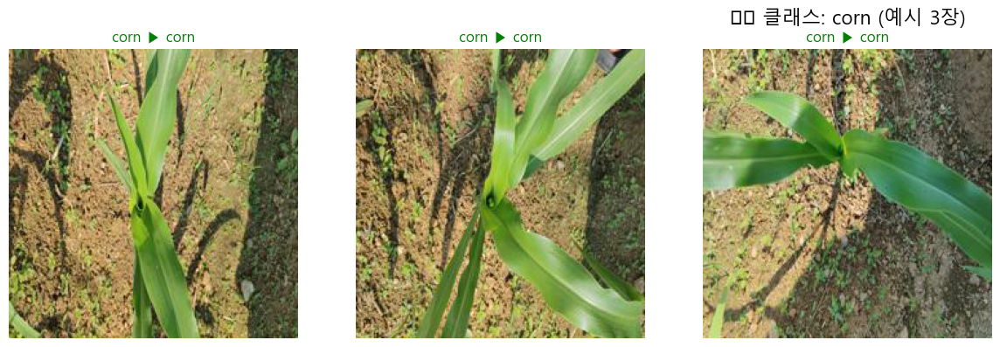

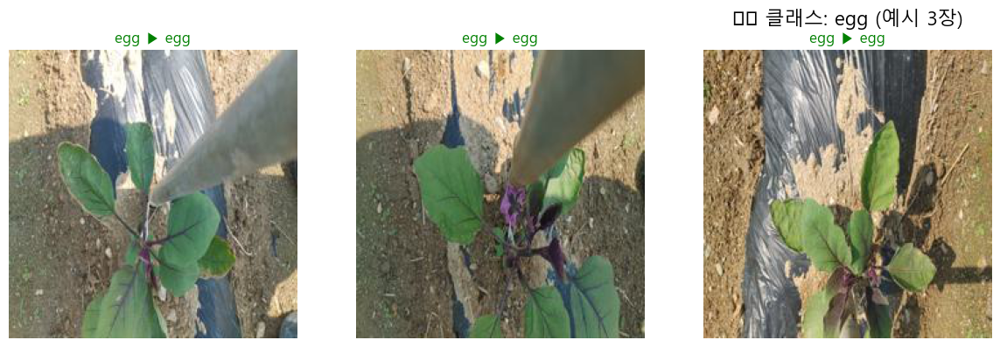

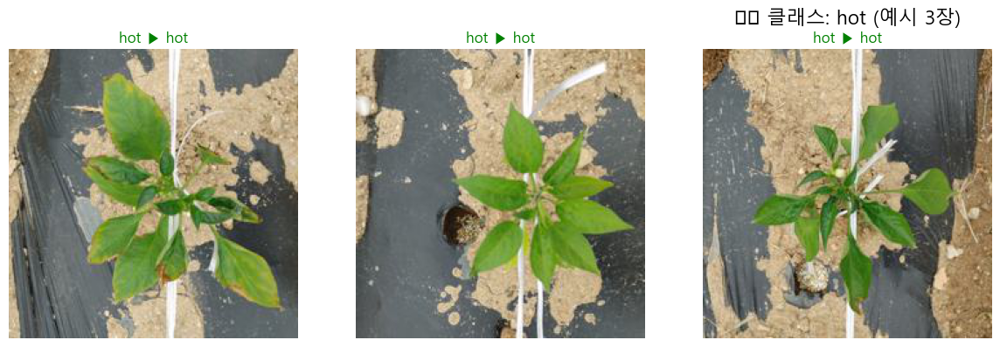

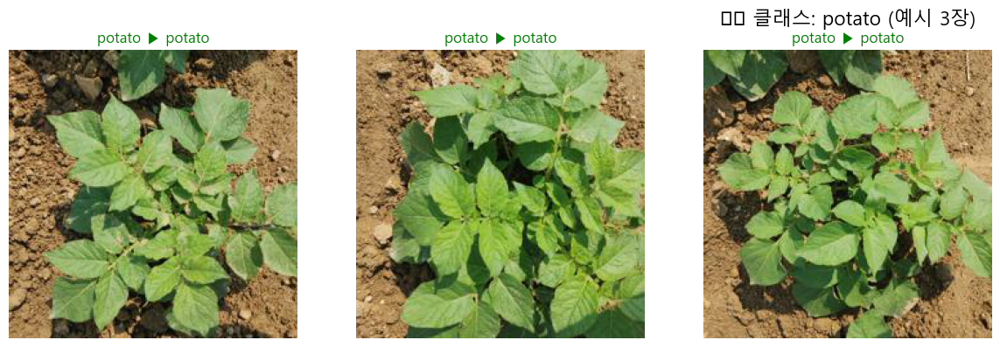

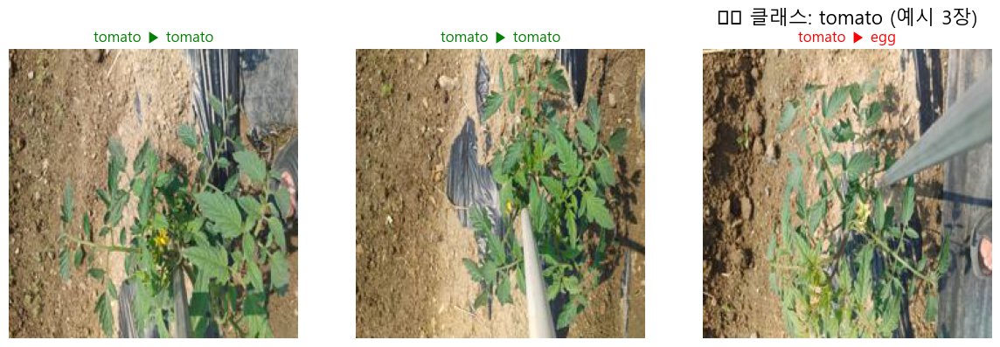

...

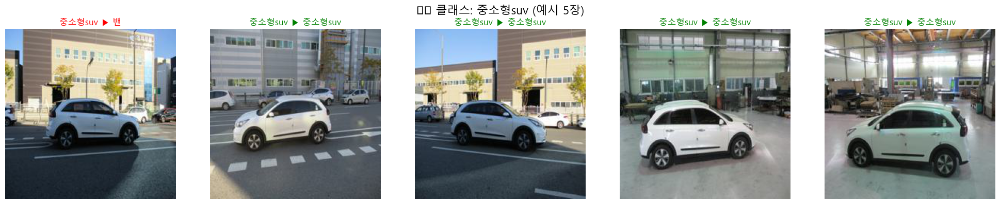

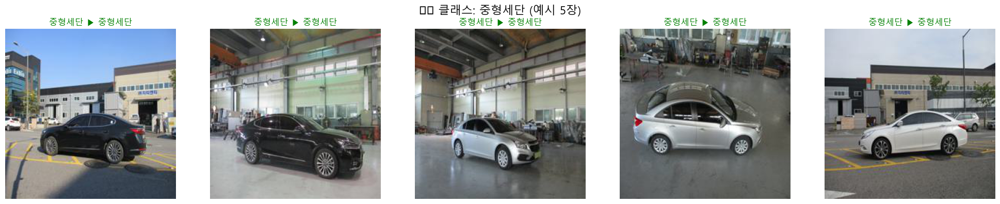

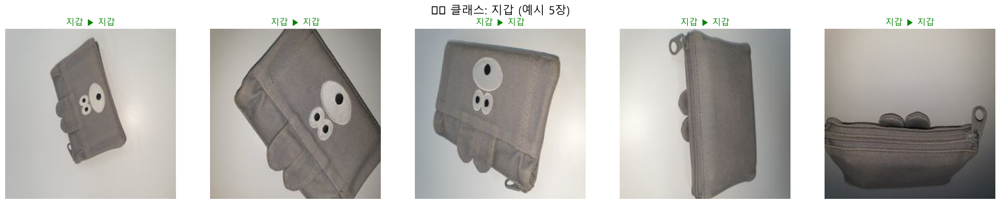

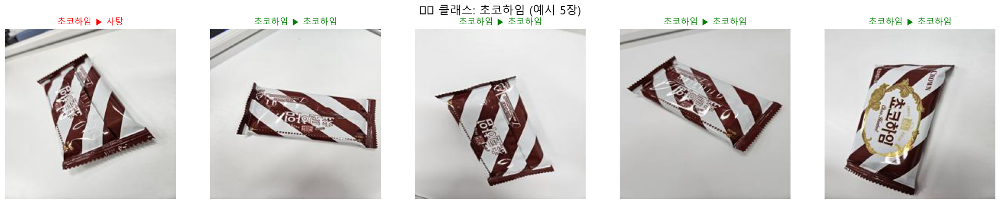

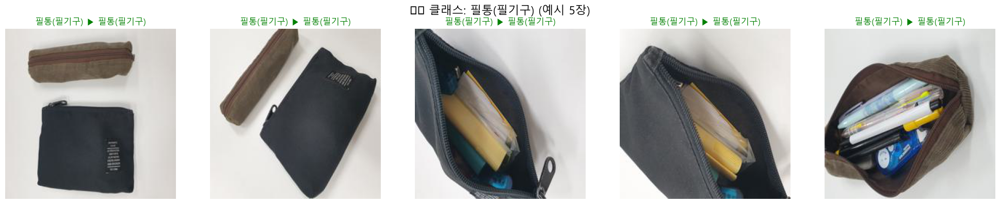

In [14]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
import math

# 테스트 폴더 경로 및 이미지 크기
test_dir = './resized_dataset/test'
img_size = (224, 224)

# 결과 저장용 리스트
results = []

# ✅ 각 클래스 폴더 순회
for class_name in sorted(os.listdir(test_dir)):
    class_path = os.path.join(test_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # 폴더 내 이미지 순회
    for file_name in os.listdir(class_path):
        file_path = os.path.join(class_path, file_name)
        if not file_path.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue

        # 이미지 불러오기 및 전처리
        img = image.load_img(file_path, target_size=img_size)
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        # 예측
        pred = model.predict(x)
        pred_class = class_names[np.argmax(pred)]

        # 결과 저장
        results.append({
            'true_class': class_name,
            'pred_class': pred_class,
            'img_path': file_path
        })

# ✅ DataFrame으로 정리
df = pd.DataFrame(results)

# ✅ 클래스별 최대 N개씩 시각화
sample_per_class = 5
grouped = df.groupby('true_class')
for class_name, group in grouped:
    sample = group.head(sample_per_class)
    count = len(sample)
    cols = 5
    rows = math.ceil(count / cols)

    plt.figure(figsize=(4 * cols, 4 * rows))
    for i, row in enumerate(sample.itertuples()):
        img = image.load_img(row.img_path, target_size=img_size)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        color = 'green' if row.true_class == row.pred_class else 'red'
        plt.title(f'{row.true_class} ▶ {row.pred_class}', color=color)

    plt.suptitle(f'🖼️ 클래스: {class_name} (예시 {count}장)', fontsize=16)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━

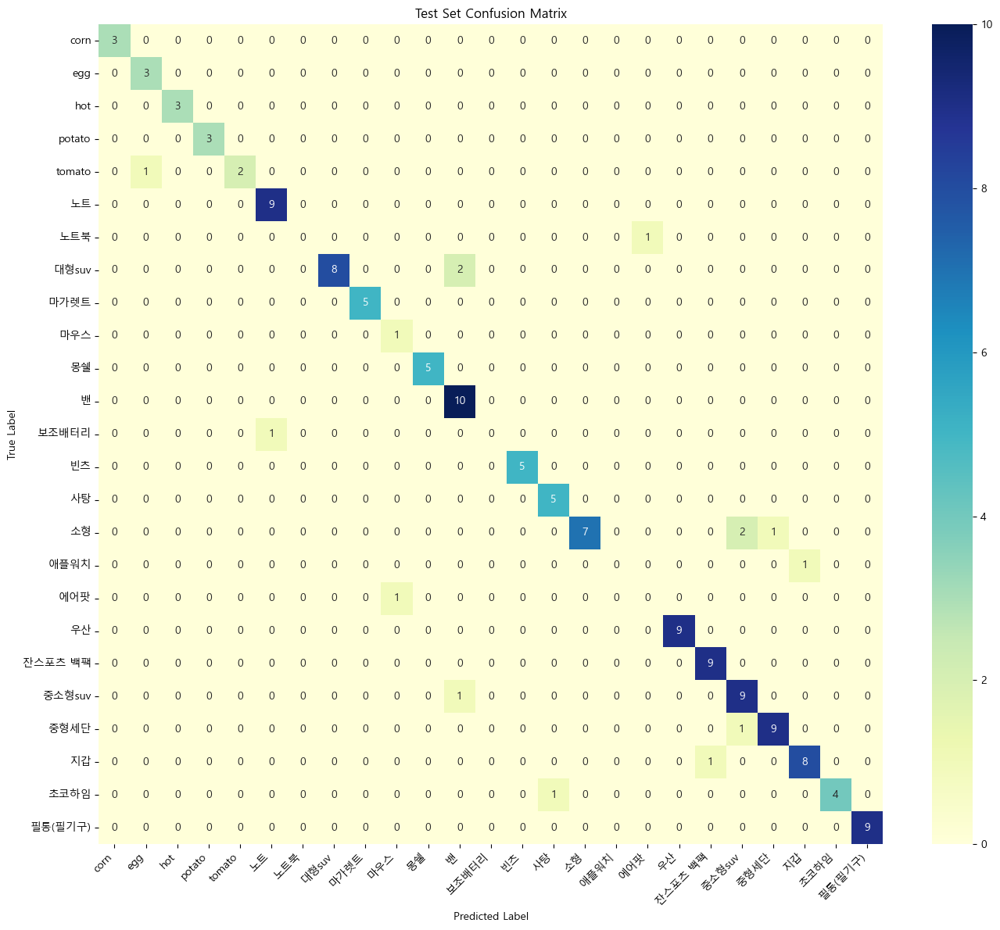


📊 Classification Report:
              precision    recall  f1-score   support

        corn       1.00      1.00      1.00         3
         egg       0.75      1.00      0.86         3
         hot       1.00      1.00      1.00         3
      potato       1.00      1.00      1.00         3
      tomato       1.00      0.67      0.80         3
          노트       0.90      1.00      0.95         9
         노트북       0.00      0.00      0.00         1
       대형suv       1.00      0.80      0.89        10
        마가렛트       1.00      1.00      1.00         5
         마우스       0.50      1.00      0.67         1
          몽쉘       1.00      1.00      1.00         5
           밴       0.77      1.00      0.87        10
       보조배터리       0.00      0.00      0.00         1
          빈츠       1.00      1.00      1.00         5
          사탕       0.83      1.00      0.91         5
          소형       1.00      0.70      0.82        10
        애플워치       0.00      0.00      0.00         1
 

C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\User\anaconda3\envs\deepnlpenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

In [15]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

# 클래스 이름
class_names = sorted(os.listdir('./resized_dataset/test'))
img_size = (224, 224)

# 예측 결과 저장
y_true = []
y_pred = []

# ✅ 테스트 이미지 예측
for true_class in class_names:
    class_dir = os.path.join('./resized_dataset/test', true_class)
    if not os.path.isdir(class_dir):
        continue

    for fname in os.listdir(class_dir):
        img_path = os.path.join(class_dir, fname)
        if not img_path.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue

        # 이미지 로드 및 전처리
        img = image.load_img(img_path, target_size=img_size)
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        # 예측
        pred = model.predict(x)
        pred_class = class_names[np.argmax(pred)]

        y_true.append(true_class)
        y_pred.append(pred_class)

# ✅ 혼동행렬 계산
cm = confusion_matrix(y_true, y_pred, labels=class_names)

# ✅ 혼동행렬 시각화
plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Test Set Confusion Matrix')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# ✅ 정밀도, 재현율, F1-score 리포트 출력
print("\n📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))


In [36]:
model.save("inception_resnetv2_model.h5")